> ## **Reason to create this Notebook**

I have created this notebook because I feel easy to wite code in jupyter notebook and after completing all the tasks I will write back in python file.

## **Importing Libraries**

In [1]:
import pandas as pd
from glob import glob

In [2]:
## First I am reading single CSV file
single_file_acc = pd.read_csv('../Data/Raw-Data/MetaMotion/A-bench-heavy2-rpe8_MetaWear_2019-01-11T16.10.08.270_C42732BE255C_Accelerometer_12.500Hz_1.4.4.csv')

In [3]:
single_file_acc.head(10)

,epoch (ms),time (01:00),elapsed (s),x-axis (g),y-axis (g),z-axis (g)
0,1547219408431,2019-01-11T16:10:08.431,0.00,0.010,0.964,-0.087
1,1547219408511,2019-01-11T16:10:08.511,0.08,0.000,0.961,-0.069
2,1547219408591,2019-01-11T16:10:08.591,0.16,0.001,0.974,-0.087
3,1547219408671,2019-01-11T16:10:08.671,0.24,-0.012,0.971,-0.084
4,1547219408751,2019-01-11T16:10:08.751,0.32,-0.013,0.954,-0.094
5,1547219408831,2019-01-11T16:10:08.831,0.40,-0.017,0.902,-0.108
6,1547219408911,2019-01-11T16:10:08.911,0.48,-0.025,0.855,-0.128
7,1547219408991,2019-01-11T16:10:08.991,0.56,-0.042,0.844,-0.139
8,1547219409071,2019-01-11T16:10:09.071,0.64,-0.049,0.875,-0.171
9,1547219409151,2019-01-11T16:10:09.151,0.72,-0.075,0.871,-0.139


In [4]:
single_file_gyro = pd.read_csv('../Data/Raw-Data/MetaMotion/A-bench-heavy2-rpe8_MetaWear_2019-01-11T16.10.08.270_C42732BE255C_Gyroscope_25.000Hz_1.4.4.csv')

In [5]:
single_file_gyro

,epoch (ms),time (01:00),elapsed (s),x-axis (deg/s),y-axis (deg/s),z-axis (deg/s)
0,1547219408351,2019-01-11T16:10:08.351,0.00,0.122,-5.488,-3.841
1,1547219408391,2019-01-11T16:10:08.391,0.04,2.195,-9.695,-0.610
2,1547219408431,2019-01-11T16:10:08.431,0.08,2.622,-8.110,-4.024
3,1547219408471,2019-01-11T16:10:08.471,0.12,1.951,-4.695,-4.634
4,1547219408511,2019-01-11T16:10:08.511,0.16,1.524,-2.561,-2.500
...,...,...,...,...,...,...
409,1547219424711,2019-01-11T16:10:24.711,16.36,2.195,-1.402,4.268
410,1547219424751,2019-01-11T16:10:24.751,16.40,4.451,-1.220,0.244
411,1547219424791,2019-01-11T16:10:24.791,16.44,7.195,-4.329,6.524
412,1547219424831,2019-01-11T16:10:24.831,16.48,8.963,-1.037,-0.366


In [6]:
files = glob('../Data/Raw-Data/MetaMotion/*.csv')

In [7]:
len(files)

187

---

### We are fetching three things from file path
1. Participant (A, B, C, D, E)
2. Label 
3. Category

In [8]:
data_path = '../Data/Raw-Data/MetaMotion\\'

In [9]:
f = files[0]

In [10]:
participant = f.split('-')[0]
participant= participant.replace(data_path, "")

In [11]:
participant

'A'

In [12]:
label = f.split('-')[1]

In [13]:
category = f.split('-')[2].rstrip('1234')

In [14]:
df = pd.read_csv(f)

In [15]:
df['Participant']  = participant
df['label'] = label
df['category'] = category

In [16]:
df

,epoch (ms),time (01:00),elapsed (s),x-axis (g),y-axis (g),z-axis (g),Participant,label,category
0,1547219408431,2019-01-11T16:10:08.431,0.00,0.010,0.964,-0.087,A,bench,heavy
1,1547219408511,2019-01-11T16:10:08.511,0.08,0.000,0.961,-0.069,A,bench,heavy
2,1547219408591,2019-01-11T16:10:08.591,0.16,0.001,0.974,-0.087,A,bench,heavy
3,1547219408671,2019-01-11T16:10:08.671,0.24,-0.012,0.971,-0.084,A,bench,heavy
4,1547219408751,2019-01-11T16:10:08.751,0.32,-0.013,0.954,-0.094,A,bench,heavy
...,...,...,...,...,...,...,...,...,...
201,1547219424511,2019-01-11T16:10:24.511,16.08,0.027,0.970,-0.091,A,bench,heavy
202,1547219424591,2019-01-11T16:10:24.591,16.16,0.010,0.990,-0.068,A,bench,heavy
203,1547219424671,2019-01-11T16:10:24.671,16.24,0.011,0.978,-0.091,A,bench,heavy
204,1547219424751,2019-01-11T16:10:24.751,16.32,0.008,0.937,-0.085,A,bench,heavy


In [17]:
acc_df = pd.DataFrame()
gyro_df = pd.DataFrame()

In [18]:
acc_set = 1
gyro_set = 1

In [19]:
for file in files:
    participant = file.split('-')[0]
    participant= participant.replace(data_path, "")
    label = file.split('-')[1]
    category = file.split('-')[2].rstrip('123').rstrip('2_MetaWear_2019')
    df = pd.read_csv(file)
    df['Participant']  = participant
    df['label'] = label
    df['category'] = category 
    if 'Accelerometer' in file:
        df['set'] = acc_set
        acc_set += 1
        acc_df = pd.concat([acc_df, df])
    if 'Gyroscope' in file:
        df['set'] = gyro_set
        gyro_set += 1
        gyro_df = pd.concat([gyro_df, df])

In [20]:
acc_df

,epoch (ms),time (01:00),elapsed (s),x-axis (g),y-axis (g),z-axis (g),Participant,label,category,set
0,1547219408431,2019-01-11T16:10:08.431,0.00,0.010,0.964,-0.087,A,bench,heavy,1
1,1547219408511,2019-01-11T16:10:08.511,0.08,0.000,0.961,-0.069,A,bench,heavy,1
2,1547219408591,2019-01-11T16:10:08.591,0.16,0.001,0.974,-0.087,A,bench,heavy,1
3,1547219408671,2019-01-11T16:10:08.671,0.24,-0.012,0.971,-0.084,A,bench,heavy,1
4,1547219408751,2019-01-11T16:10:08.751,0.32,-0.013,0.954,-0.094,A,bench,heavy,1
...,...,...,...,...,...,...,...,...,...,...
237,1547666063089,2019-01-16 20:14:23.089,18.96,0.012,0.596,0.815,E,squat,heavy,94
238,1547666063169,2019-01-16 20:14:23.169,19.04,0.009,0.528,0.821,E,squat,heavy,94
239,1547666063249,2019-01-16 20:14:23.249,19.12,0.015,0.554,0.746,E,squat,heavy,94
240,1547666063329,2019-01-16 20:14:23.329,19.20,0.006,0.574,0.824,E,squat,heavy,94


In [21]:
gyro_df

,epoch (ms),time (01:00),elapsed (s),x-axis (deg/s),y-axis (deg/s),z-axis (deg/s),Participant,label,category,set
0,1547219408351,2019-01-11T16:10:08.351,0.00,0.122,-5.488,-3.841,A,bench,heavy,1
1,1547219408391,2019-01-11T16:10:08.391,0.04,2.195,-9.695,-0.610,A,bench,heavy,1
2,1547219408431,2019-01-11T16:10:08.431,0.08,2.622,-8.110,-4.024,A,bench,heavy,1
3,1547219408471,2019-01-11T16:10:08.471,0.12,1.951,-4.695,-4.634,A,bench,heavy,1
4,1547219408511,2019-01-11T16:10:08.511,0.16,1.524,-2.561,-2.500,A,bench,heavy,1
...,...,...,...,...,...,...,...,...,...,...
487,1547666063314,2019-01-16 20:14:23.314,19.48,-1.707,-0.671,1.585,E,squat,heavy,93
488,1547666063354,2019-01-16 20:14:23.354,19.52,0.915,0.305,2.988,E,squat,heavy,93
489,1547666063394,2019-01-16 20:14:23.394,19.56,5.854,-2.561,1.463,E,squat,heavy,93
490,1547666063434,2019-01-16 20:14:23.434,19.60,4.268,0.549,-0.305,E,squat,heavy,93


### Saving the Processed Data into new folder

In [22]:
# acc_df.to_csv('../Processed/Accelerometer.csv')
# gyro_df.to_csv('../Processed/Gyroscope.csv')

In [2]:
acc_df = pd.read_csv('../Data/Processed-Data/Accelerometer.csv')
gyro_df = pd.read_csv('../Data/Processed-Data/Gyroscope.csv')

In [3]:
acc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23578 entries, 0 to 23577
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    23578 non-null  int64  
 1   epoch (ms)    23578 non-null  int64  
 2   time (01:00)  23578 non-null  object 
 3   elapsed (s)   23578 non-null  float64
 4   x-axis (g)    23578 non-null  float64
 5   y-axis (g)    23578 non-null  float64
 6   z-axis (g)    23578 non-null  float64
 7   Participant   23578 non-null  object 
 8   label         23578 non-null  object 
 9   category      23578 non-null  object 
 10  set           23578 non-null  int64  
dtypes: float64(4), int64(3), object(4)
memory usage: 2.0+ MB


In [4]:
# df['epoch (ms)'] = pd.to_datetime(df['epoch (ms)'], unit='ms')

NameError: name 'df' is not defined

In [30]:
# df['time (01:00)'] = pd.to_datetime(df['time (01:00)'])

In [5]:
acc_df.index  = pd.to_datetime(acc_df['epoch (ms)'], unit='ms')

In [6]:
gyro_df.index  = pd.to_datetime(gyro_df['epoch (ms)'], unit='ms')

### Removing the un-necessary columns

In [7]:
del acc_df['Unnamed: 0']
del acc_df['elapsed (s)']
del acc_df['epoch (ms)']
del acc_df['time (01:00)']

del gyro_df['Unnamed: 0']
del gyro_df['elapsed (s)']
del gyro_df['epoch (ms)']
del gyro_df['time (01:00)']

In [39]:
acc_df

,x-axis (g),y-axis (g),z-axis (g),Participant,label,category,set
epoch (ms),,,,,,,
2019-01-11 15:10:08.431,0.010,0.964,-0.087,A,bench,heavy,1
2019-01-11 15:10:08.511,0.000,0.961,-0.069,A,bench,heavy,1
2019-01-11 15:10:08.591,0.001,0.974,-0.087,A,bench,heavy,1
2019-01-11 15:10:08.671,-0.012,0.971,-0.084,A,bench,heavy,1
2019-01-11 15:10:08.751,-0.013,0.954,-0.094,A,bench,heavy,1
...,...,...,...,...,...,...,...
2019-01-16 19:14:23.089,0.012,0.596,0.815,E,squat,heavy,94
2019-01-16 19:14:23.169,0.009,0.528,0.821,E,squat,heavy,94
2019-01-16 19:14:23.249,0.015,0.554,0.746,E,squat,heavy,94


In [40]:
acc_df = pd.read_csv('../Data/Processed-Data/Accelerometer.csv')
gyro_df = pd.read_csv('../Data/Processed-Data/Gyroscope.csv')

In [10]:
files = glob('../Raw/MetaMotion/*.csv')
data_path = '../Raw/MetaMotion\\'
def read_data(files):
    ## acc stands for Accelerometer DataFrame
    acc_df = pd.DataFrame()

    ###gyro stands for gyroscope DataFrame
    gyro_df = pd.DataFrame()

    ## Creating a Counter
    acc_set = 1
    gyro_set = 1

    for file in files:
        participant = file.split('-')[0]
        participant= participant.replace(data_path, "")
        label = file.split('-')[1]
        category = file.split('-')[2].rstrip('123').rstrip('2_MetaWear_2019')
        df = pd.read_csv(file)
        df['Participant']  = participant
        df['label'] = label
        df['category'] = category 
        if 'Accelerometer' in file:
            df['set'] = acc_set
            acc_set += 1
            acc_df = pd.concat([acc_df, df])
        if 'Gyroscope' in file:
            df['set'] = gyro_set
            gyro_set += 1
            gyro_df = pd.concat([gyro_df, df])

    # --------------------------------------------------------------
    # Working with datetimes
    # --------------------------------------------------------------

    acc_df.index  = pd.to_datetime(acc_df['epoch (ms)'], unit='ms')

    gyro_df.index  = pd.to_datetime(gyro_df['epoch (ms)'], unit='ms')

    # del acc_df['Unnamed: 0']
    del acc_df['elapsed (s)']
    del acc_df['epoch (ms)']
    del acc_df['time (01:00)']

    # del gyro_df['Unnamed: 0']
    del gyro_df['elapsed (s)']
    del gyro_df['epoch (ms)']
    del gyro_df['time (01:00)']
    
    return acc_df, gyro_df

In [11]:
acc_df, gyro_df = read_data(files)

In [12]:
### Merging the DataFrames
data_merged  = pd.concat([acc_df.iloc[:, :3], gyro_df], axis=1)

In [13]:
data_merged.head(2)

,x-axis (g),y-axis (g),z-axis (g),x-axis (deg/s),y-axis (deg/s),z-axis (deg/s),Participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:04.950,NaN,NaN,NaN,-10.671,-1.524,5.976,B,bench,heavy,30.0
2019-01-11 15:08:04.990,NaN,NaN,NaN,-8.720,-2.073,3.171,B,bench,heavy,30.0


In [14]:
data_merged.columns = [
    'acc_x',
    'acc_y',
    'acc_z',
    'gyro_x',
    'gyro_y',
    'gyro_z',
    'Participant',
    'label',
    'category',
    'set'
]

In [15]:
data_merged.head(4)

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,Participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:04.950,NaN,NaN,NaN,-10.671,-1.524,5.976,B,bench,heavy,30.0
2019-01-11 15:08:04.990,NaN,NaN,NaN,-8.720,-2.073,3.171,B,bench,heavy,30.0
2019-01-11 15:08:05.030,NaN,NaN,NaN,0.488,-3.537,-4.146,B,bench,heavy,30.0
2019-01-11 15:08:05.070,NaN,NaN,NaN,0.244,-5.854,3.537,B,bench,heavy,30.0


In [16]:
numerical_cols = [i for i in data_merged.columns if data_merged[i].dtype != 'object']

In [19]:
data_merged[numerical_cols].resample(rule='200ms').mean()

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,set
epoch (ms),,,,,,,
2019-01-11 15:08:04.800,NaN,NaN,NaN,-9.6955,-1.7985,4.5735,30.0
2019-01-11 15:08:05.000,NaN,NaN,NaN,-2.0122,-0.4270,-1.6218,30.0
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,30.0
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,30.0
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,30.0
...,...,...,...,...,...,...,...
2019-01-20 17:35:12.800,-0.041000,-1.247000,-0.074667,NaN,NaN,NaN,NaN
2019-01-20 17:35:13.000,-0.039000,-1.037500,-0.043500,NaN,NaN,NaN,NaN
2019-01-20 17:35:13.200,-0.050667,-1.009667,-0.042667,NaN,NaN,NaN,NaN


In [20]:
data_merged.columns

Index(['acc_x', 'acc_y', 'acc_z', 'gyro_x', 'gyro_y', 'gyro_z', 'Participant',
       'label', 'category', 'set'],
      dtype='object')

In [21]:
sampling = {
    'acc_x': "mean",
    'acc_y': "mean",
    'acc_z': "mean",
    'gyro_x': "mean",
    'gyro_y': "mean",
    'gyro_z': "mean",
    
    'Participant': 'last',
    'label': 'last',
    'category': 'last',
    'set': 'last'
}

In [23]:
data_merged[:1000].resample(rule='200ms').apply(sampling)

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,Participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:04.800,NaN,NaN,NaN,-9.69550,-1.7985,4.5735,B,bench,heavy,30.0
2019-01-11 15:08:05.000,NaN,NaN,NaN,-2.01220,-0.4270,-1.6218,B,bench,heavy,30.0
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.89040,2.4392,0.9388,B,bench,heavy,30.0
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.68260,-0.8904,2.1708,B,bench,heavy,30.0
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.56080,-0.2560,-1.4146,B,bench,heavy,30.0
...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:10:21.600,-0.174000,1.092667,-0.153333,-4.96360,-16.4026,21.9026,A,bench,heavy,1.0
2019-01-11 15:10:21.800,-0.219500,1.402500,-0.109000,-7.52440,18.6706,-22.6828,A,bench,heavy,1.0
2019-01-11 15:10:22.000,-0.192000,0.871667,-0.155667,2.60980,8.7070,-14.8658,A,bench,heavy,1.0


In [24]:
days = [g for n, g in data_merged.groupby(pd.Grouper(freq='D'))]

In [25]:
days[0]

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,Participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:04.950,NaN,NaN,NaN,-10.671,-1.524,5.976,B,bench,heavy,30.0
2019-01-11 15:08:04.990,NaN,NaN,NaN,-8.720,-2.073,3.171,B,bench,heavy,30.0
2019-01-11 15:08:05.030,NaN,NaN,NaN,0.488,-3.537,-4.146,B,bench,heavy,30.0
2019-01-11 15:08:05.070,NaN,NaN,NaN,0.244,-5.854,3.537,B,bench,heavy,30.0
2019-01-11 15:08:05.110,NaN,NaN,NaN,-0.915,0.061,-2.805,B,bench,heavy,30.0
...,...,...,...,...,...,...,...,...,...,...
2019-01-11 16:24:55.706,NaN,NaN,NaN,-8.415,7.683,4.207,A,dead,medium,6.0
2019-01-11 16:24:55.746,NaN,NaN,NaN,-4.573,-5.732,2.744,A,dead,medium,6.0
2019-01-11 16:24:55.753,0.005,-1.022,-0.176,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
data_resampled = pd.concat([df.resample(rule='200ms').apply(sampling).dropna() for df in days])

In [28]:
data_resampled.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9009 entries, 2019-01-11 15:08:05.200000 to 2019-01-20 17:33:27.800000
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   acc_x        9009 non-null   float64
 1   acc_y        9009 non-null   float64
 2   acc_z        9009 non-null   float64
 3   gyro_x       9009 non-null   float64
 4   gyro_y       9009 non-null   float64
 5   gyro_z       9009 non-null   float64
 6   Participant  9009 non-null   object 
 7   label        9009 non-null   object 
 8   category     9009 non-null   object 
 9   set          9009 non-null   float64
dtypes: float64(7), object(3)
memory usage: 774.2+ KB


In [29]:
data_resampled['set'] = data_resampled['set'].astype('int')

In [30]:
data_resampled.to_csv('../Processed/Cleaned.csv')

In [31]:
data_resampled.to_pickle('../Data/interim-Data/01_data_processed.pkl')

---

# **Visualization**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import plotly.express as px

## Load the Cleaned Data

### Previously we save our files in 2 formats
1. .pickle
2. .csv

We can use any of the 2 format to read the data

In [2]:
### I am using .pickle file
df = pd.read_pickle('../Data/interim-Data/01_data_processed.pkl')
df.head(10)

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,Participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
2019-01-11 15:08:06.200,-0.026000,0.965000,-0.118000,0.4634,5.2194,-6.4636,B,bench,heavy,30
2019-01-11 15:08:06.400,-0.048667,0.790000,-0.145333,21.6950,8.1708,-28.2196,B,bench,heavy,30
2019-01-11 15:08:06.600,-0.170000,0.899500,-0.250000,17.5246,1.5976,-17.5854,B,bench,heavy,30
2019-01-11 15:08:06.800,-0.222667,0.907000,-0.204333,-7.2318,-1.3536,-0.4026,B,bench,heavy,30


In [5]:
## Plotting set column
set_df = df[df['set'] == 1] ## We are taking first set 


In [6]:
set_df

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,Participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:10:08.400,0.003667,0.966333,-0.081000,1.8412,-4.7806,-2.5608,A,bench,heavy,1
2019-01-11 15:10:08.600,-0.012500,0.962500,-0.089000,2.1950,-2.1096,-2.8538,A,bench,heavy,1
2019-01-11 15:10:08.800,-0.028000,0.867000,-0.125000,9.5246,-2.8290,-11.1828,A,bench,heavy,1
2019-01-11 15:10:09.000,-0.062000,0.873000,-0.155000,16.5608,-4.4268,-13.0368,A,bench,heavy,1
2019-01-11 15:10:09.200,-0.096667,0.904333,-0.169000,7.6952,-11.8538,-3.0364,A,bench,heavy,1
...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:10:24.000,0.038667,0.967667,-0.100000,-0.2194,-4.9756,-3.8658,A,bench,heavy,1
2019-01-11 15:10:24.200,0.018500,0.972500,-0.083000,0.7924,-1.8536,0.6220,A,bench,heavy,1
2019-01-11 15:10:24.400,0.019667,0.970333,-0.079667,-1.9270,0.5852,-2.0246,A,bench,heavy,1


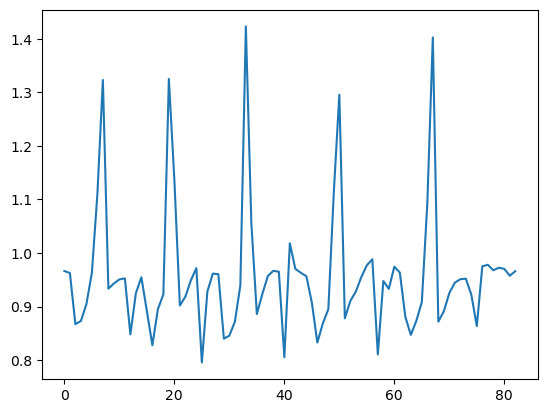

In [8]:
plt.plot(set_df['acc_y'].reset_index(drop=True))

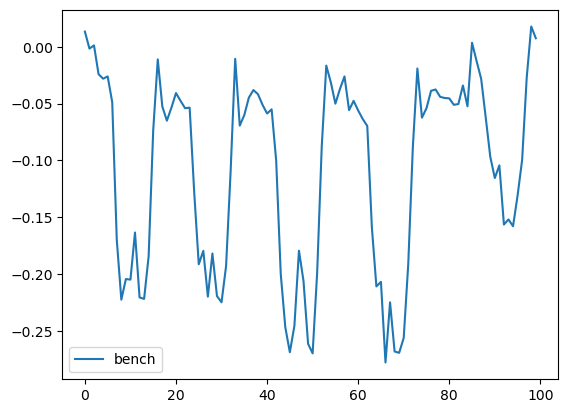

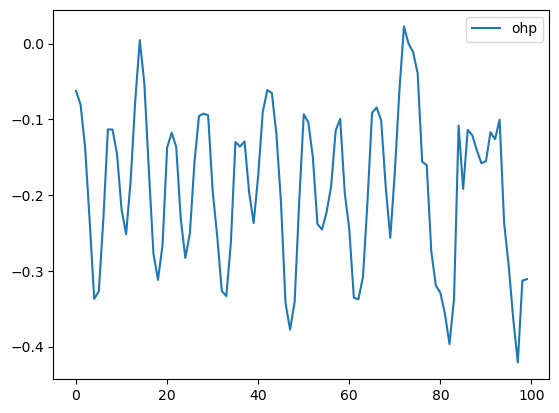

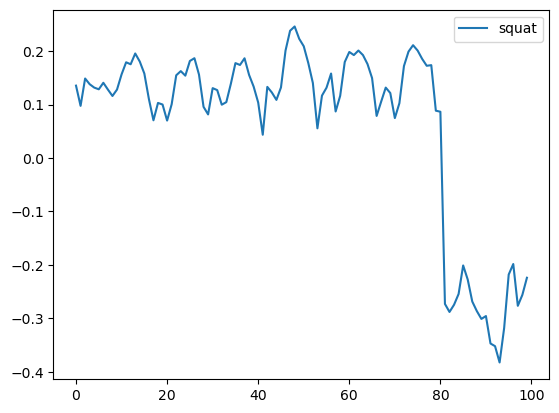

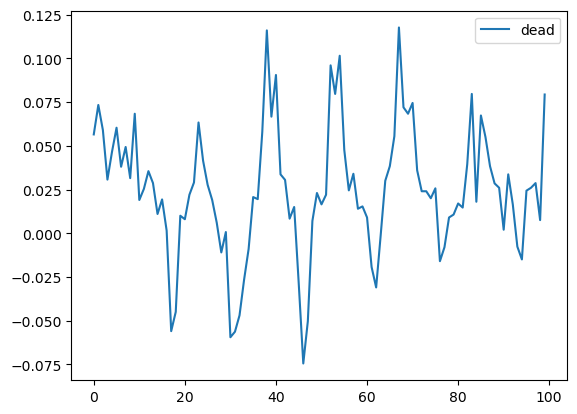

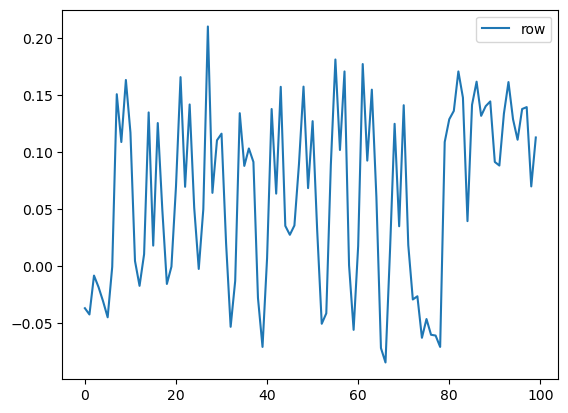

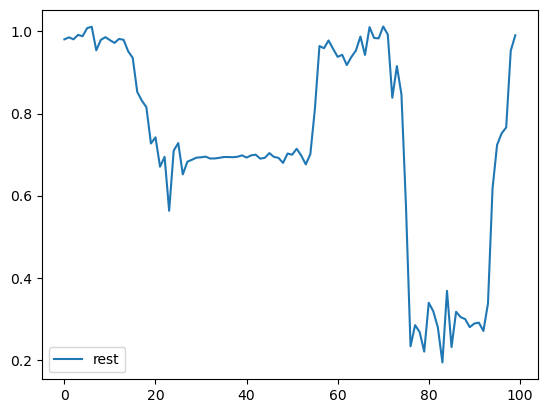

In [11]:
### Creating a for loop to check the individual label
df['label'].unique() ### This gives us the all the unique values in the label column
## Now writing for loop
for label in df['label'].unique():
    subset = df[df['label'] == label] ## This command will fetch all the labels in the dataframe and will use it to plot different labels
    ### Creating custom plot using matplotlib
    fig, ax = plt.subplots()
    ## We are taking only 100 samples 
    plt.plot(subset[:100]['acc_x'].reset_index(drop=True), label = label)
    plt.legend()
    plt.show()

In [13]:
mpl.style.use('seaborn-v0_8-deep')
mpl.rcParams['figure.figsize'] = (10, 5)
mpl.rcParams['figure.dpi'] = 100

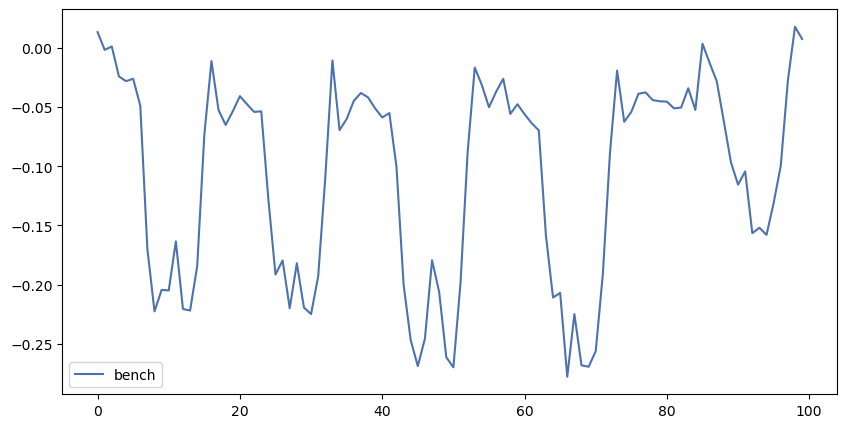

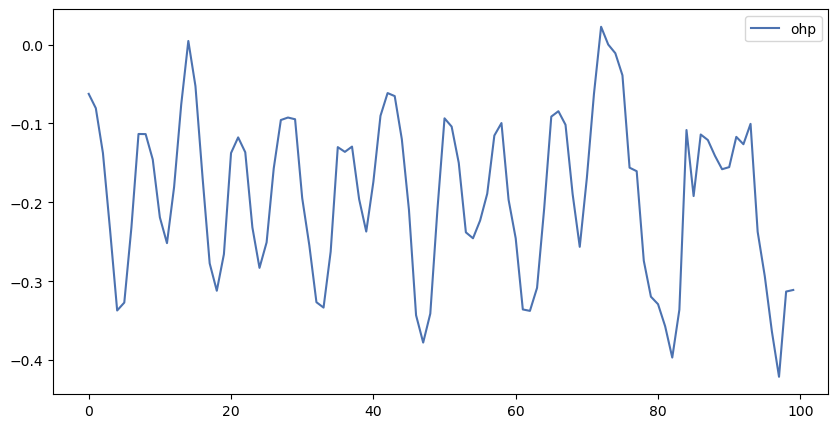

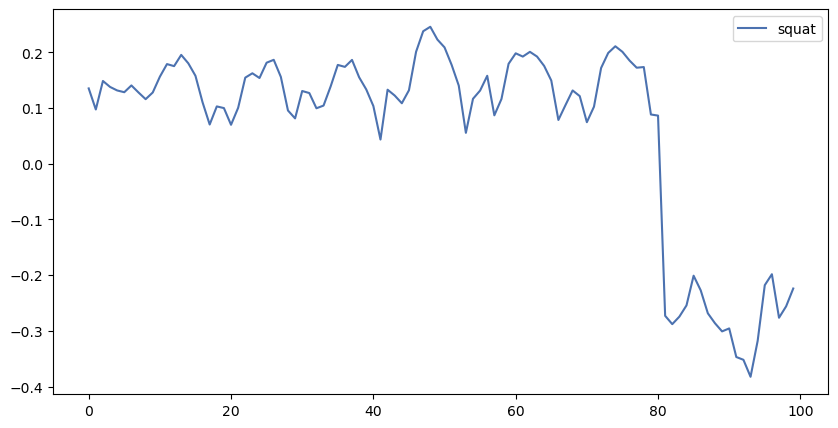

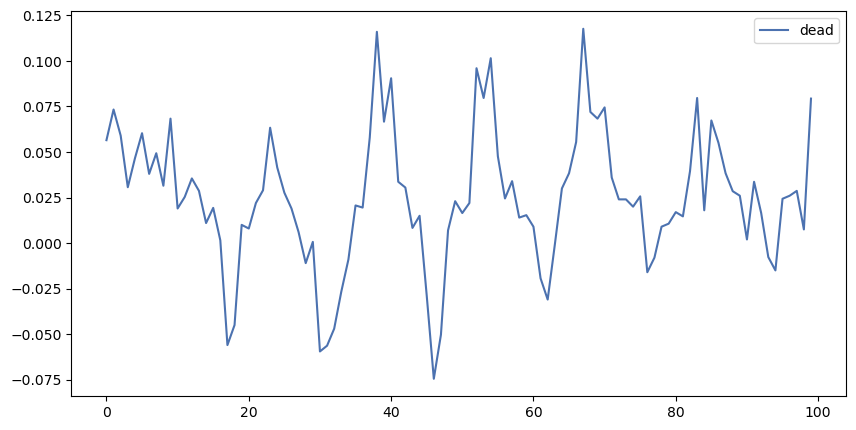

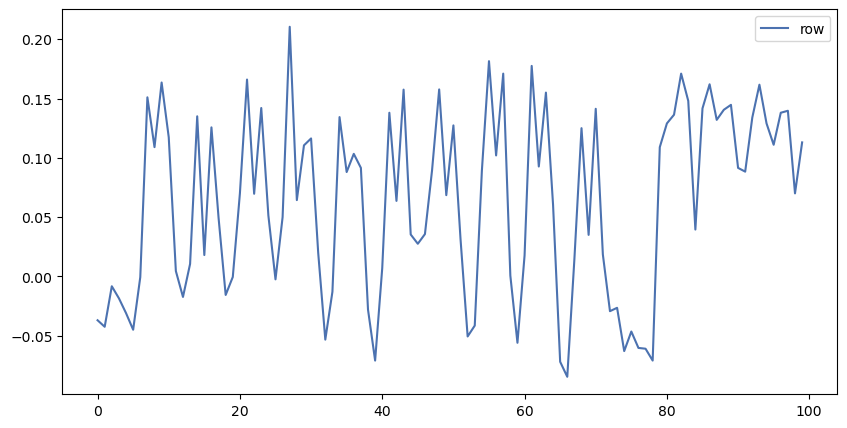

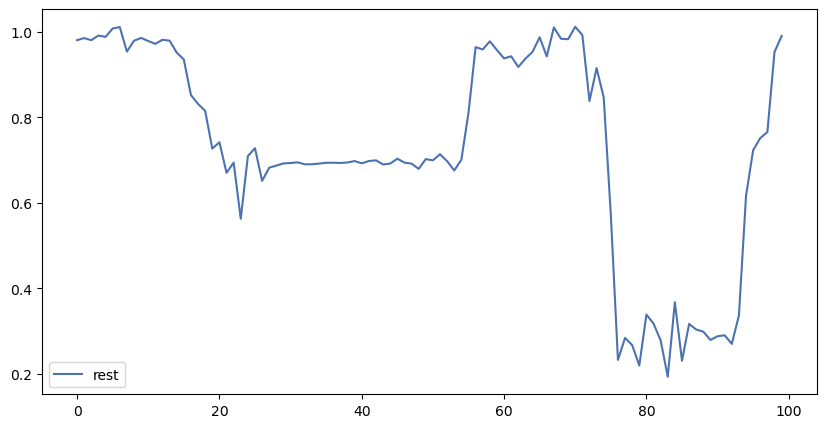

In [14]:
## Now writing for loop
for label in df['label'].unique():
    subset = df[df['label'] == label] ## This command will fetch all the labels in the dataframe and will use it to plot different labels
    ### Creating custom plot using matplotlib
    fig, ax = plt.subplots()
    ## We are taking only 100 samples 
    plt.plot(subset[:100]['acc_x'].reset_index(drop=True), label = label)
    plt.legend()
    plt.show()

In [16]:
# Compare medium vs. heavy sets
category_df = df.query("label == 'squat'").query("Participant == 'A'").reset_index()

In [17]:
category_df

,epoch (ms),acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,Participant,label,category,set
0,2019-01-11 16:05:44.600,0.135333,0.694667,0.735333,2.5366,-0.6220,1.6098,A,squat,medium,27
1,2019-01-11 16:05:44.800,0.097500,0.651500,0.658000,2.0854,0.0366,0.1952,A,squat,medium,27
2,2019-01-11 16:05:45.000,0.148667,0.719667,0.694333,-0.0364,1.2562,0.0242,A,squat,medium,27
3,2019-01-11 16:05:45.200,0.138000,0.692000,0.632000,5.9878,-4.5734,1.0976,A,squat,medium,27
4,2019-01-11 16:05:45.400,0.131667,0.716000,0.658000,-4.1586,-2.9636,-0.5852,A,squat,medium,27
...,...,...,...,...,...,...,...,...,...,...,...
619,2019-01-15 19:14:22.600,0.022333,0.482667,0.656000,-8.0976,5.9026,2.9512,A,squat,heavy,26
620,2019-01-15 19:14:22.800,0.028500,0.472500,0.657500,-5.4024,1.6340,3.1584,A,squat,heavy,26
621,2019-01-15 19:14:23.000,0.012000,0.574667,0.839667,6.3904,-1.0854,2.0856,A,squat,heavy,26
622,2019-01-15 19:14:23.200,0.010500,0.564000,0.785000,5.0246,-1.2196,1.8900,A,squat,heavy,26


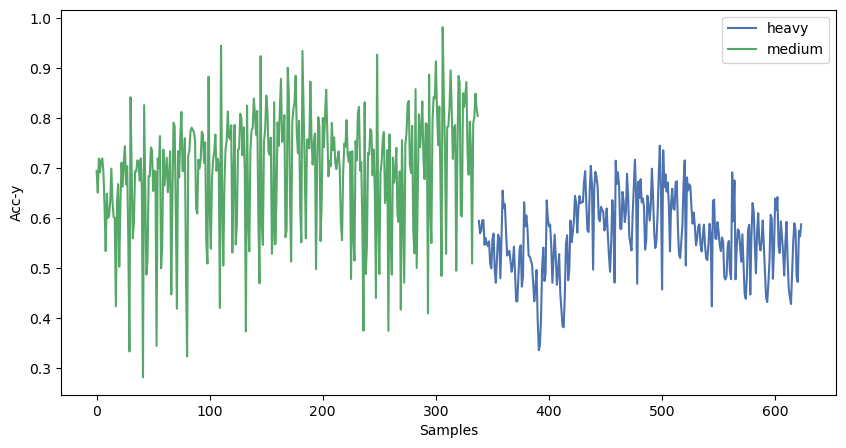

In [18]:
fig, ax = plt.subplots()
category_df.groupby(['category'])['acc_y'].plot() ## This wil groupby data on different category
ax.set_ylabel('Acc-y')
ax.set_xlabel('Samples')
ax.legend();

### Observations:
Through the above plot we can see that the medium category has high frequency and heavy has low uit is because in heavy set we can't do fast steps

In [25]:
# Compare participants
participant_df = df.query("label == 'bench'").sort_values('Participant').reset_index()

In [26]:
participant_df

,epoch (ms),acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,Participant,label,category,set
0,2019-01-14 13:22:50.400,-0.314000,1.260000,-0.545500,-4.122000,-0.134200,-1.2684,A,bench,heavy,4
1,2019-01-14 13:27:07.800,-0.212333,0.771000,-0.413333,17.329200,-4.097600,14.1954,A,bench,heavy,2
2,2019-01-14 13:27:08.000,-0.225500,0.942500,-0.491500,-1.500000,-0.817000,18.9268,A,bench,heavy,2
3,2019-01-14 13:27:08.200,-0.263333,1.275000,-0.605000,-33.305000,4.658600,-40.5120,A,bench,heavy,2
4,2019-01-14 13:27:08.400,-0.212000,0.779500,-0.419500,-10.012000,3.024400,-13.8416,A,bench,heavy,2
...,...,...,...,...,...,...,...,...,...,...,...
1660,2019-01-15 13:23:01.200,-0.076500,0.910500,-0.299500,5.743800,-0.743800,1.0244,E,bench,heavy,68
1661,2019-01-15 13:23:01.400,-0.068667,0.919667,-0.339000,5.902400,-2.146400,0.3170,E,bench,heavy,68
1662,2019-01-15 13:23:01.600,-0.068500,0.920000,-0.363000,4.609600,-2.817000,2.9268,E,bench,heavy,68
1663,2019-01-15 13:23:00.200,-0.272333,0.858667,-0.414333,5.560800,1.634200,10.8414,E,bench,heavy,68


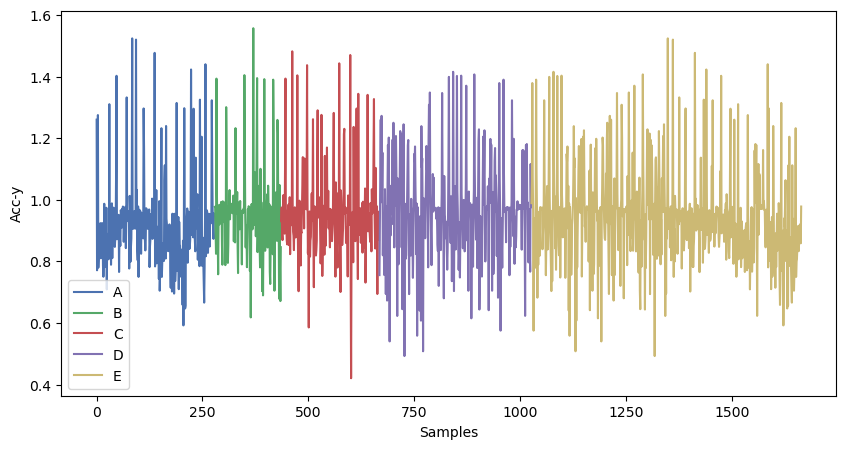

In [27]:
fig, ax = plt.subplots()
participant_df.groupby(['Participant'])['acc_y'].plot() ## This wil groupby data on different category
ax.set_ylabel('Acc-y')
ax.set_xlabel('Samples')
ax.legend();

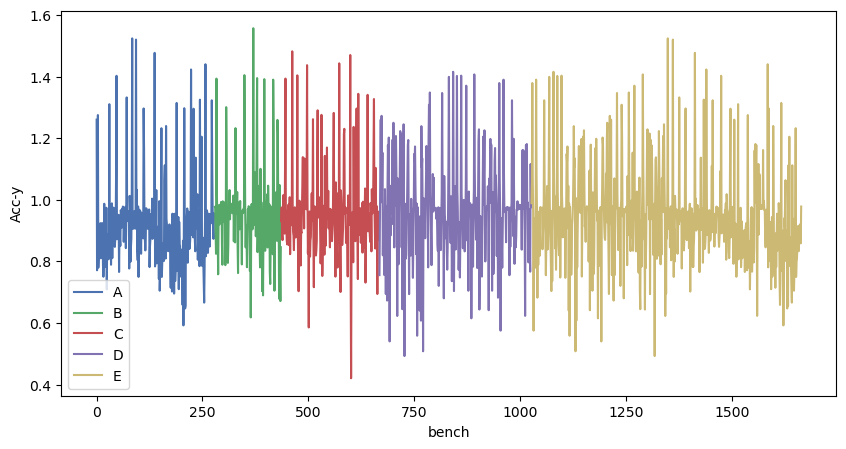

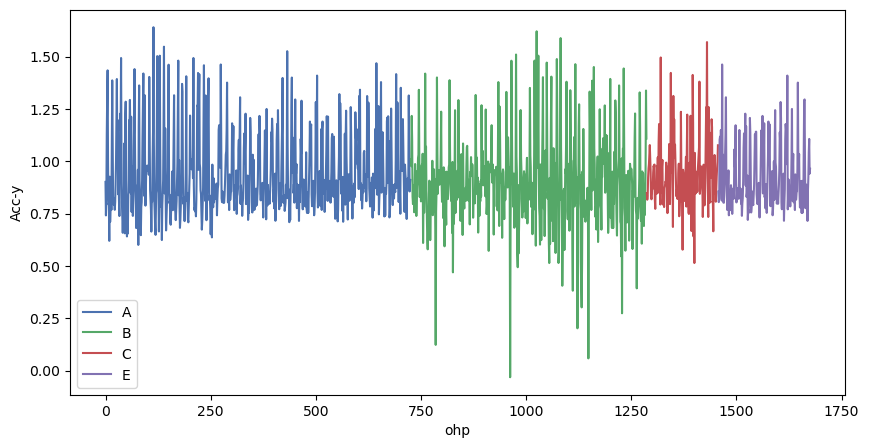

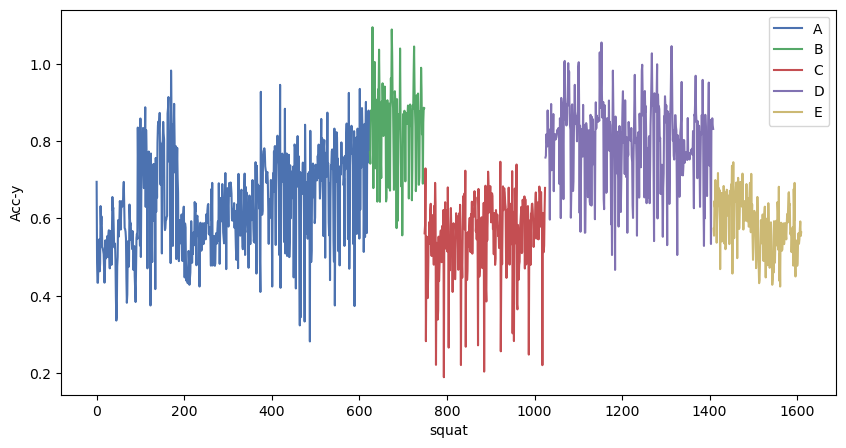

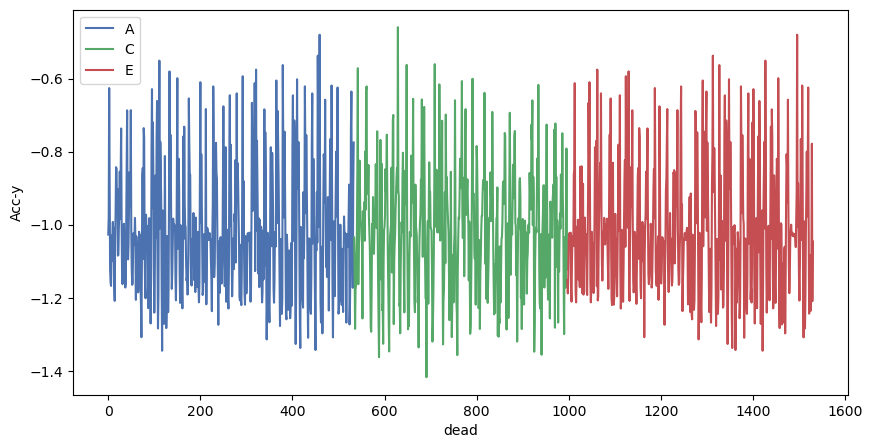

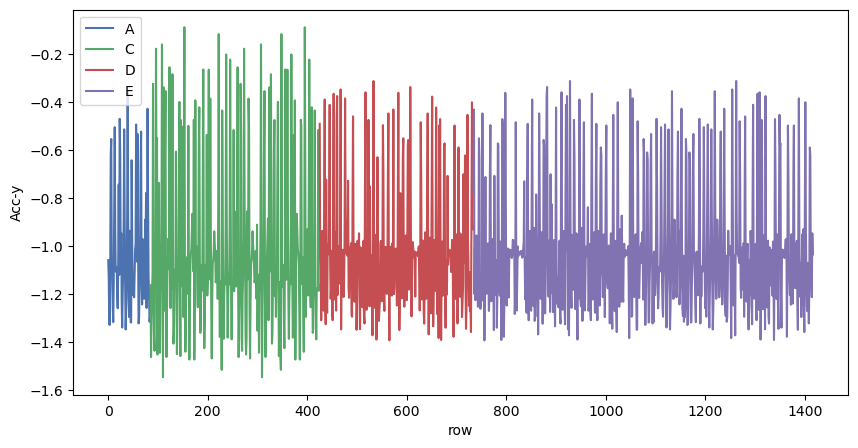

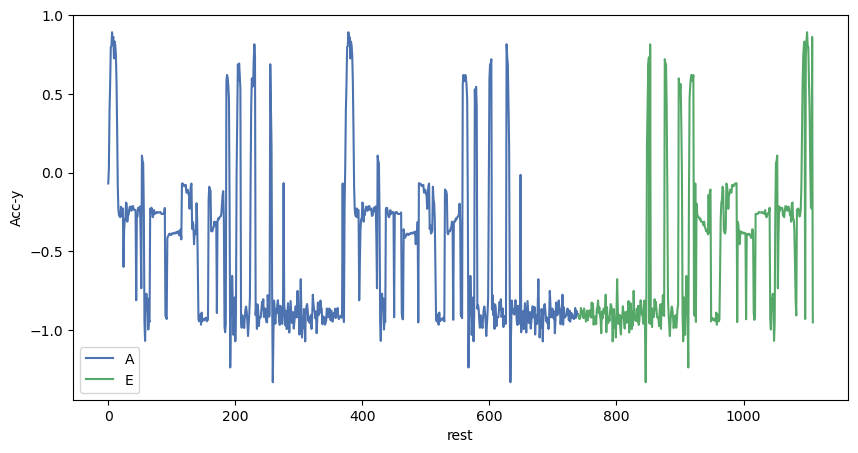

In [32]:
### Creating a for loop to check all the labels and their medium and heavy sets
for label in df['label'].unique():
    participant_df_a = df.query(f"label == '{label}'").sort_values('Participant').reset_index()
    fig, ax = plt.subplots()
    participant_df_a.groupby(['Participant'])['acc_y'].plot() ## This wil groupby data on different category
    ax.set_ylabel('Acc-y')
    ax.set_xlabel(label)
    ax.legend()
    plt.show()

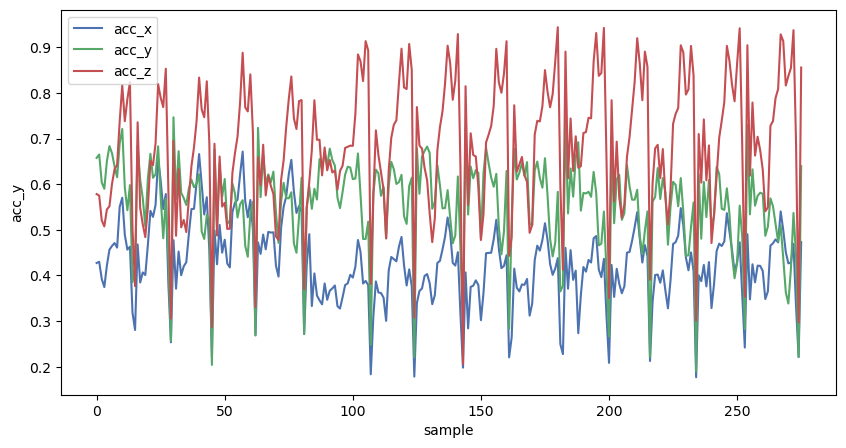

In [39]:
label = 'squat'
participant = 'C'
all_axis_df = df.query(f"label == '{label}'").query(f"Participant == '{participant}'").reset_index()

fig, ax = plt.subplots()
all_axis_df[['acc_x', 'acc_y', 'acc_z']].plot(ax=ax)
ax.set_ylabel('acc_y')
ax.set_xlabel('sample')
plt.legend()
plt.show()

In [40]:
participant = 'C'
label = 'row'
combined_plot_df = df.query(f"label == '{label}'").query(f"Participant == '{participant}'").reset_index(drop=True)

In [41]:
combined_plot_df

,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,Participant,label,category,set
0,-0.037000,-0.854000,0.271000,-31.8172,-1.6830,-6.3660,C,row,medium,51
1,-0.042500,-0.884000,0.174000,-56.3416,-8.3172,-9.9388,C,row,medium,51
2,-0.008333,-0.967667,0.030333,-31.4388,-3.0732,0.9266,C,row,medium,51
3,-0.018500,-1.046500,-0.042500,-4.5244,-4.9632,1.3536,C,row,medium,51
4,-0.031000,-1.098667,-0.062333,7.7318,1.9634,4.4878,C,row,medium,51
...,...,...,...,...,...,...,...,...,...,...
335,0.044500,-1.254000,-0.008000,-27.9512,1.9512,15.1832,C,row,heavy,50
336,0.018667,-1.178667,-0.079000,1.8170,-2.2926,1.4390,C,row,heavy,50
337,0.024000,-1.001000,-0.046000,3.7074,-3.6340,-0.3294,C,row,heavy,50
338,0.020333,-1.003333,-0.050000,-3.3170,-0.0120,-0.4758,C,row,heavy,50


<Axes: >

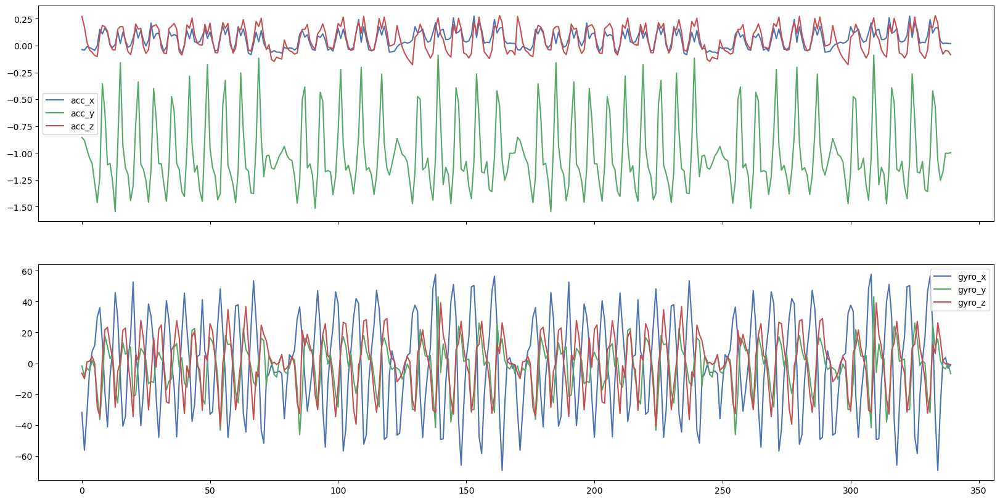

In [42]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(20, 10))
combined_plot_df[['acc_x', 'acc_y', 'acc_z']].plot(ax=ax[0])
combined_plot_df[['gyro_x', 'gyro_y', 'gyro_z']].plot(ax=ax[1])



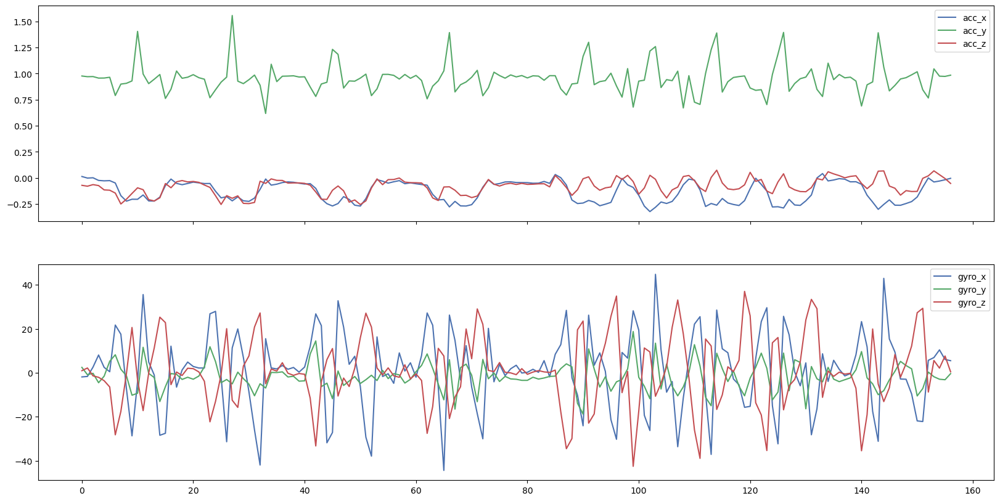

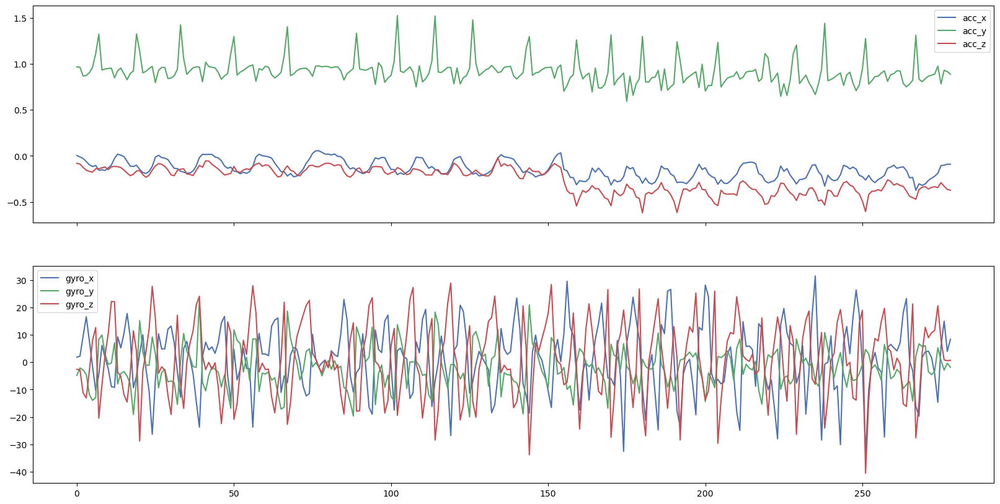

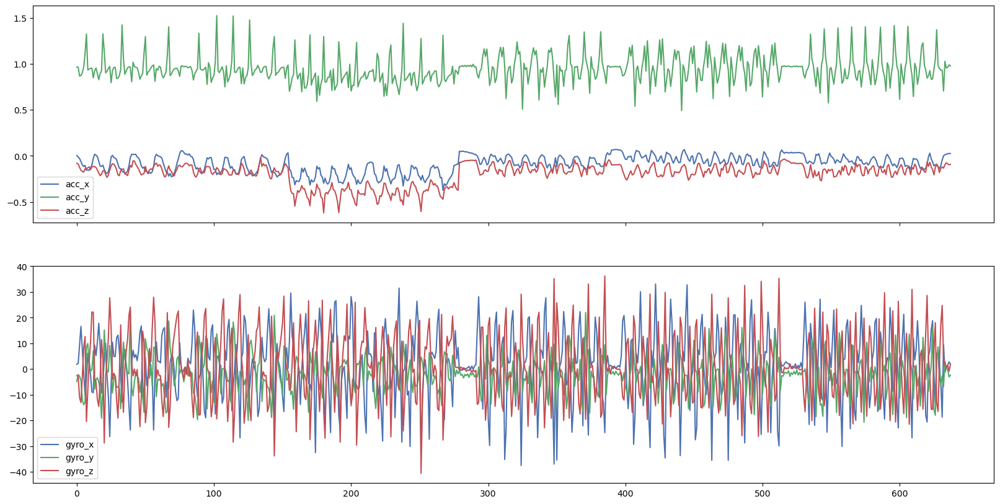

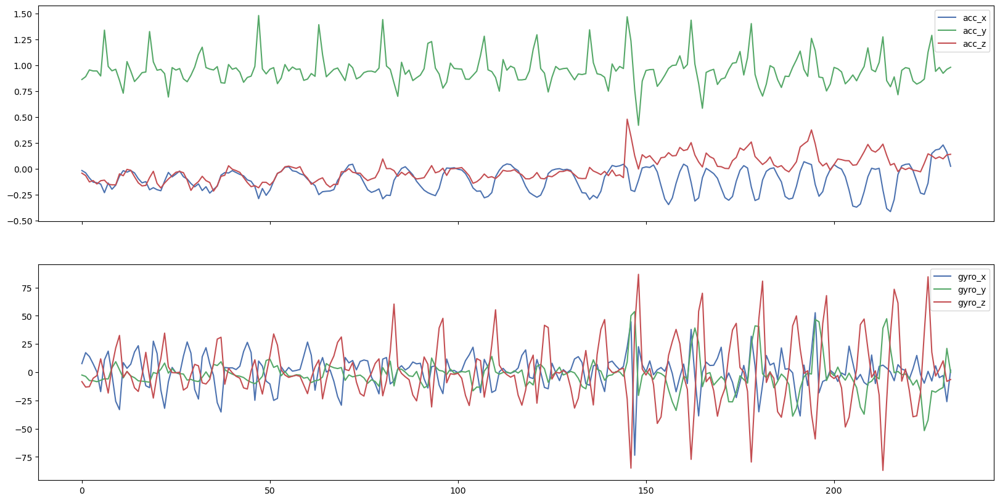

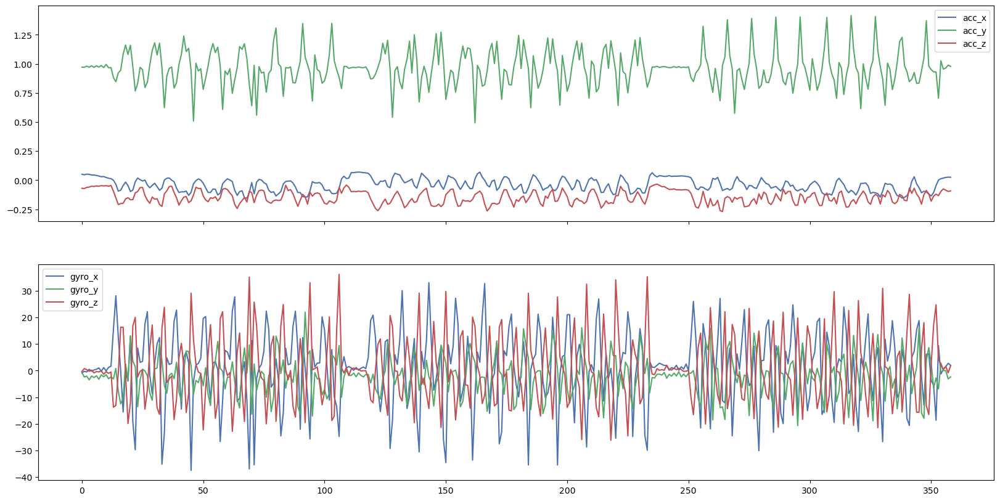

...

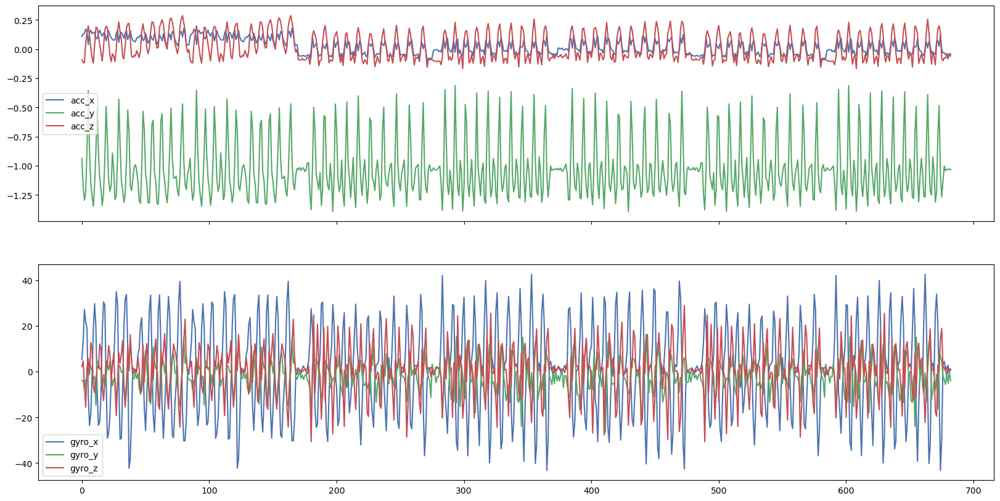

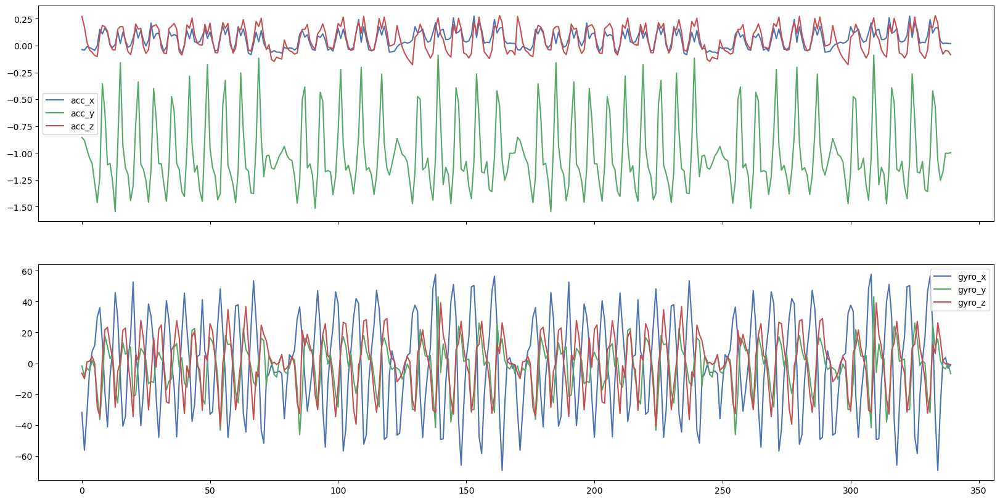

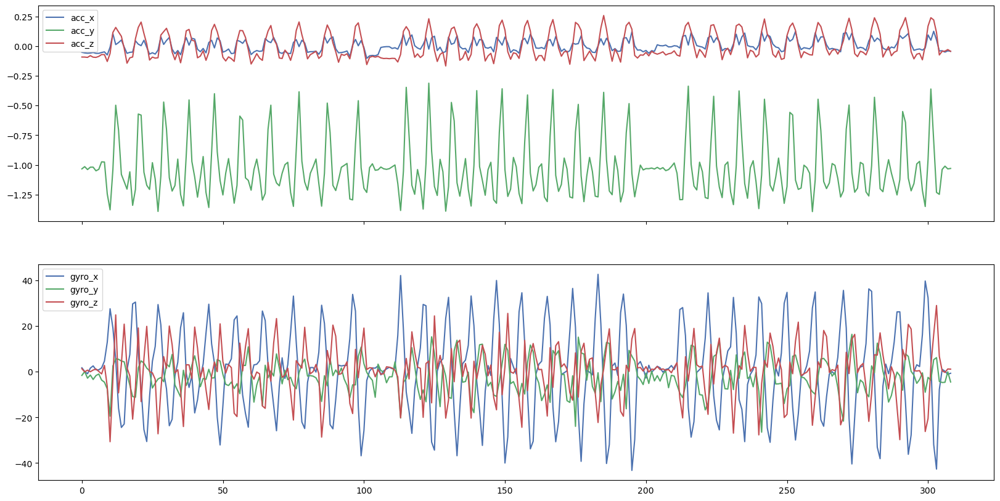

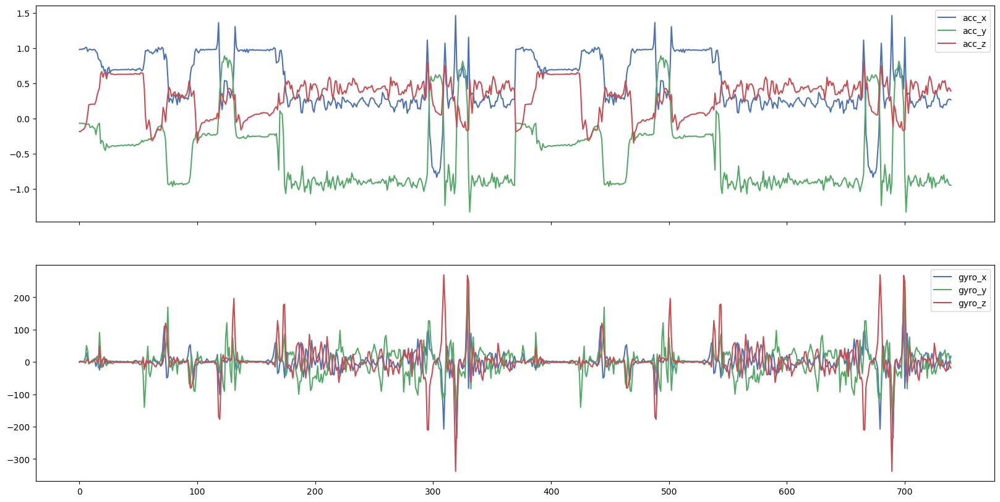

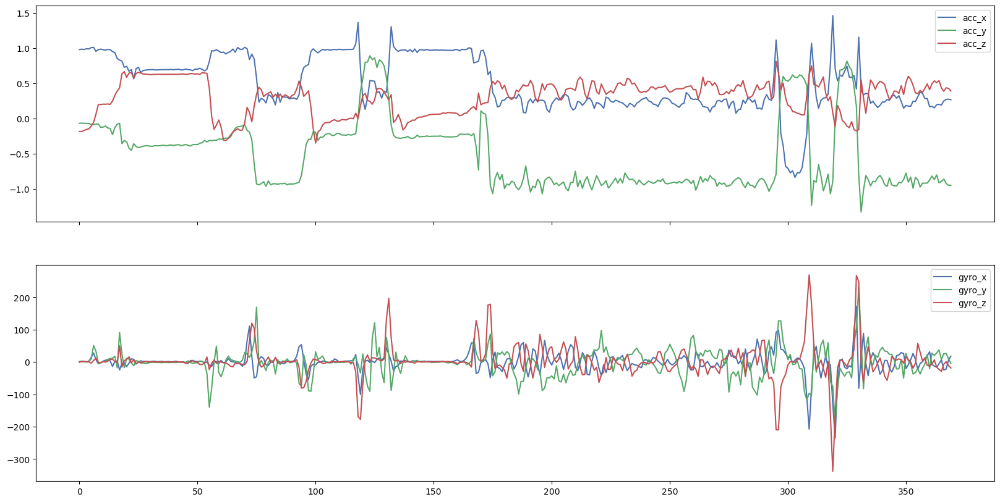

In [45]:
labels = df['label'].unique()
Participants = df['Participant'].unique()

for label in labels:
    for participant in Participants:
        combined_plot_df = df.query(f"label == '{label}'").query(f"Participant == '{participant}'").reset_index(drop=True)
        
        if len(combined_plot_df) > 0:
            fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(20, 10))
            combined_plot_df[['acc_x', 'acc_y', 'acc_z']].plot(ax=ax[0])
            combined_plot_df[['gyro_x', 'gyro_y', 'gyro_z']].plot(ax=ax[1])
            plt.savefig(f"../Reports/figures/{label.title()} ({participant}).png")
            plt.show()
